<a href="https://colab.research.google.com/github/chengyang122/Metter.js-and-MediaPipe-Interactive-game/blob/main/IoUCalculate.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [23]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [22]:
# install dependencies: (use cu111 because colab has CUDA 11.1)
!pip install torch==1.9.0+cu111 torchvision==0.10.0+cu111 -f https://download.pytorch.org/whl/torch_stable.html

# install mmcv-full thus we could use CUDA operators
!pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.9.0/index.html

# Install mmdetection
!rm -rf mmdetection
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection

!pip install -e .

Looking in links: https://download.pytorch.org/whl/torch_stable.html
Looking in links: https://download.openmmlab.com/mmcv/dist/cu111/torch1.9.0/index.html
Cloning into 'mmdetection'...
remote: Enumerating objects: 24695, done.
remote: Counting objects: 100% (48/48), done.
remote: Compressing objects: 100% (43/43), done.
remote: Total 24695 (delta 9), reused 32 (delta 5), pack-reused 24647
Receiving objects: 100% (24695/24695), 37.65 MiB | 10.60 MiB/s, done.
Resolving deltas: 100% (17313/17313), done.
/content/mmdetection/mmdetection/mmdetection
Obtaining file:///content/mmdetection/mmdetection/mmdetection
  Attempting uninstall: mmdet
    Found existing installation: mmdet 2.24.1
    Can't uninstall 'mmdet'. No files were found to uninstall.
  Running setup.py develop for mmdet


In [100]:
# Check Pytorch installation
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
import numpy as np
import json
import pandas as pd
import cv2
# Check MMDetection installation
import mmdet
print(mmdet.__version__)
import pickle 
import mmcv
from mmcv.runner import load_checkpoint
from tqdm import tqdm
import matplotlib.pyplot as plt

from mmdet.apis import inference_detector, show_result_pyplot
from mmdet.models import build_detector
# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow
# Check mmcv installation
from mmcv.ops import get_compiling_cuda_version, get_compiler_version
print(get_compiling_cuda_version())
print(get_compiler_version())

1.9.0+cu111 True
2.24.1
11.1
GCC 7.3


In [25]:
#for inference
model = pickle.load(open('/content/drive/MyDrive/barcode/mdl.pkl','rb'))
cfg = pickle.load(open('/content/drive/MyDrive/barcode/cfg.pkl','rb'))
base = '/content/drive/MyDrive/barcode/Ananya.zip (Unzipped Files)/'


In [244]:
#collect all image
Object, Mask = result

useful_index = []
for i in range(len(Object[0])):
  score = Object[0][i][4]
  if score > 0.6:
    useful_index.append(i)

In [29]:
def calculateIoU(contour1, contour2):
    # Two separate contours trying to check intersection on
    contours = [contour1, contour2]

    # Create image filled with zeros the same size of original image
    blank = np.zeros([1944, 2592]) 

    # Copy each contour into its own image and fill it with '1'
    image1 = cv2.drawContours(blank.copy(), contours, 0, 1, thickness=cv2.FILLED)
    image2 = cv2.drawContours(blank.copy(), contours, 1, 1, thickness=cv2.FILLED)


    area1 = cv2.contourArea(contour1)
    area2 = cv2.contourArea(contour2)
    intersection = np.logical_and(image1, image2)
    contours, hierarchy = cv2.findContours(intersection.astype(np.uint8), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return 0
    common_area = cv2.contourArea(contours[0])
    IoU = common_area/(area1+area2-common_area)
    # Use the logical AND operation on the two images
    # Since the two images had bitwise and applied to it,
    # there should be a '1' or 'True' where there was intersection
    # and a '0' or 'False' where it didnt intersect
    # Check if there was a '1' in the intersection
    return IoU

In [221]:
def truePositive(predicted_box, true_box):
    sum_IoU = 0
    hit_count = 0
    for conpred in predicted_box:
      hit = 0
      for contrue in true_box:
        IoU = calculateIoU(conpred, contrue)
        if IoU>0.6:
          hit =  1
          sum_IoU = sum_IoU+IoU
      if hit == 1:
        hit_count = hit_count + 1
    if hit_count == 0:
      return 0, None
    ave_IoU = sum_IoU/hit_count    
    return hit_count, ave_IoU

In [153]:
def collect_annotation(dataframe):
  true_box = []
  for i in range(len(dataframe)):
    rec1 = dataframe.iloc[i, :]
    contour = np.array([[rec1.X1,rec1.Y1],[rec1.X2,rec1.Y2],[rec1.X3,rec1.Y3], [rec1.X4,rec1.Y4]], dtype=np.int32)
    true_box.append(contour)
  return true_box

In [163]:
def collect_predicted(result):
  Object, Mask = result
  useful_index = []
  for i in range(len(Object[0])):
    score = Object[0][i][4]
    if score > 0.6:
      useful_index.append(i)

  predicted_box = []
  predicted_contour = []
  for index in useful_index:
    mg = Mask[0][index].astype(np.uint8)
    contours, hierarchy = cv2.findContours(mg, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    cnt = contours[0]
    rect = cv2.minAreaRect(cnt)
    box = cv2.boxPoints(rect)
    box = np.int0(box)
    predicted_box.append(box)
    predicted_contour.append(cnt)
  return predicted_box, predicted_contour


## 1. get all related data from one image and  from a dataset 

In [197]:
df = pd.read_excel('/content/drive/MyDrive/barcode/testData.xlsx') # read the annotation file 
image_name = df.loc[:, 'Image Filename'].unique() # get unique item in one column 

# for image number 3 
df2 = df[df.loc[:, 'Image Filename']==image_name[3]] # choose data of one image 
imgAddress = base + image_name[3] + '.jpg'
img = mmcv.imread(imgAddress)
model.cfg = cfg
result = inference_detector(model, img)

In [166]:
predicted_box, predicted_contour = collect_predicted(result)

Treat IoU more than 0.7 as a hit 

In [157]:
dfR = df2[df2.loc[:, 'Color'] == 'R ']
dfG = df2[df2.loc[:, 'Color'] == 'G']
dfB = df2[df2.loc[:, 'Color'] == 'B']

In [198]:
df2

,Image Filename,Human-Readable Barcode,Color,X1,Y1,X2,Y2,X3,Y3,X4,Y4
30,20170713-16_17_57-RPI1-camC_undistored,cannotread,B,49,1039,0,1125,8,1233,109,1039
31,20170713-16_17_57-RPI1-camC_undistored,cannotread,G,270,1049,142,1379,222,1384,338,1057
32,20170713-16_17_57-RPI1-camC_undistored,cannotread,B,462,1090,361,1427,391,1435,505,1087
33,20170713-16_17_57-RPI1-camC_undistored,cannotread,G,560,1138,469,1521,560,1528,643,1133
34,20170713-16_17_57-RPI1-camC_undistored,cannotread,G,812,1122,759,1480,850,1490,898,1127


In [205]:
# can also collect number of R, G, B
true_box = collect_annotation(df2)
true_boxR = collect_annotation(dfR)
true_boxG = collect_annotation(dfG)
true_boxB = collect_annotation(dfB)

In [201]:
true_box = []
for i in range(len(df2)):
  rec1 = df2.iloc[i, :]
  contour = np.array([[rec1.X1,rec1.Y1],[rec1.X2,rec1.Y2],[rec1.X3,rec1.Y3], [rec1.X4,rec1.Y4]], dtype=np.int32)
  true_box.append(contour)

In [219]:
true_box = collect_annotation(df2)

In [222]:
truePositive(predicted_box, true_box) #hit for all boxes 

(5, 0.7496037028928545)

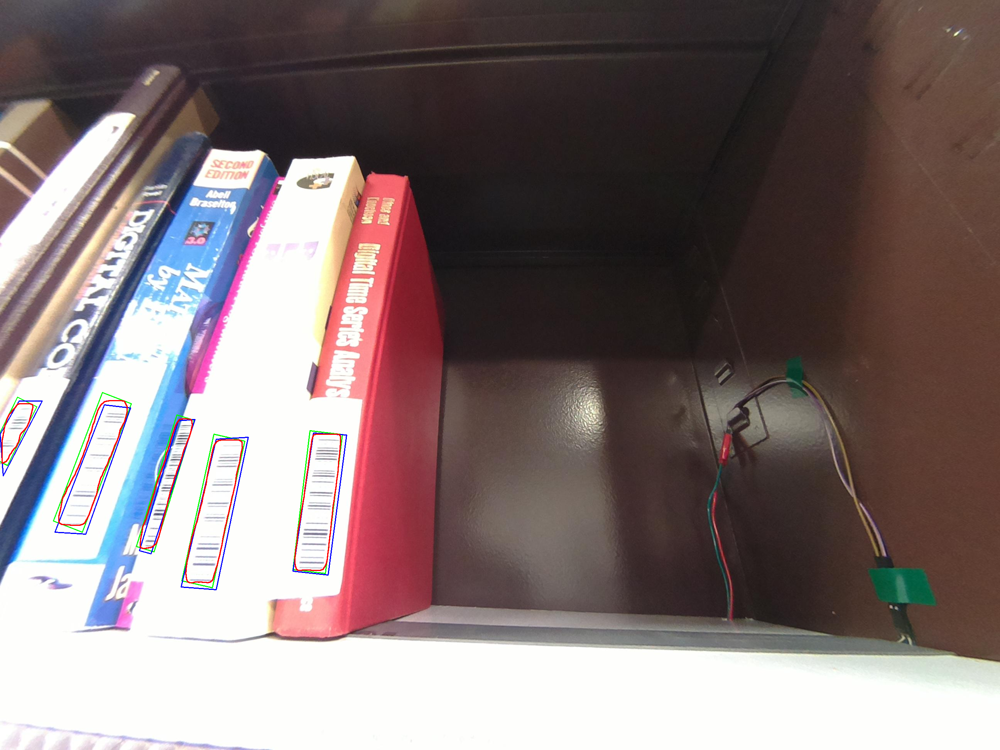

In [160]:
img = cv2.imread(imgAddress)
cv2.drawContours(img, predicted_box, -1 ,(0,255,0),2) # predicted result is green
cv2.drawContours(img, true_box, -1, (255,0,0), 2) # annotated result is blue 
cv2.drawContours(img, predicted_contour, -1,(0,0,255),2) # the predicted contour is red
cv2_imshow(img)

## 2. Use function to get all data from a dataset 

 26%|██▌       | 11/43 [00:40<01:58,  3.69s/it]

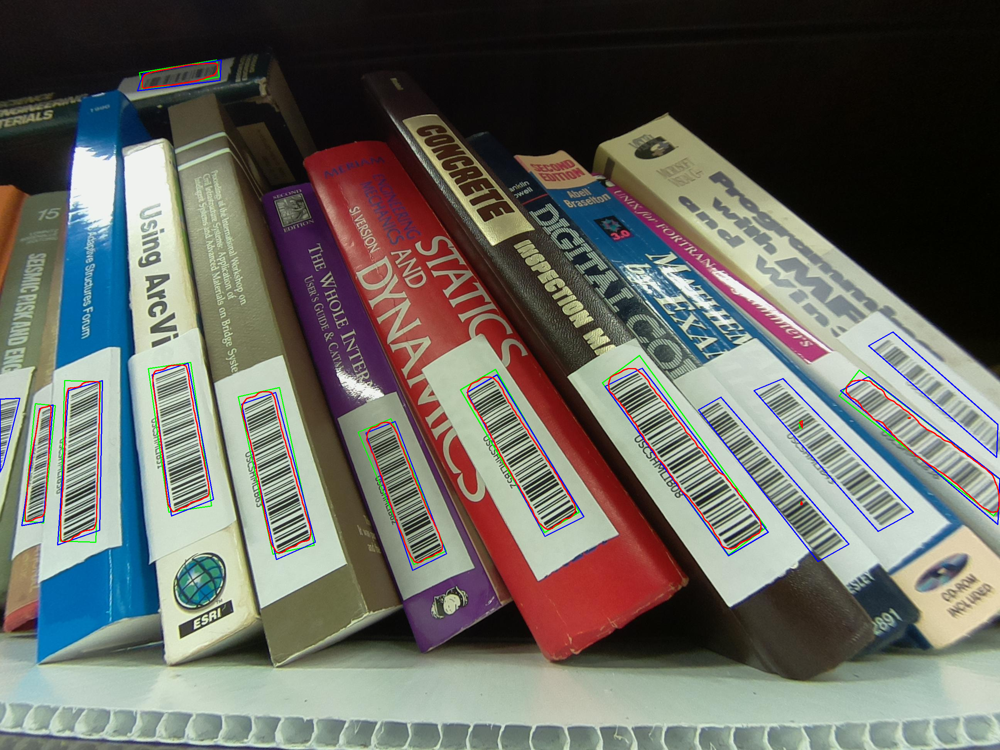

 28%|██▊       | 12/43 [00:49<02:43,  5.27s/it]

number of R mishit is 1
number of G mishit is 0
number of R mishit is 3


 40%|███▉      | 17/43 [00:57<00:54,  2.08s/it]

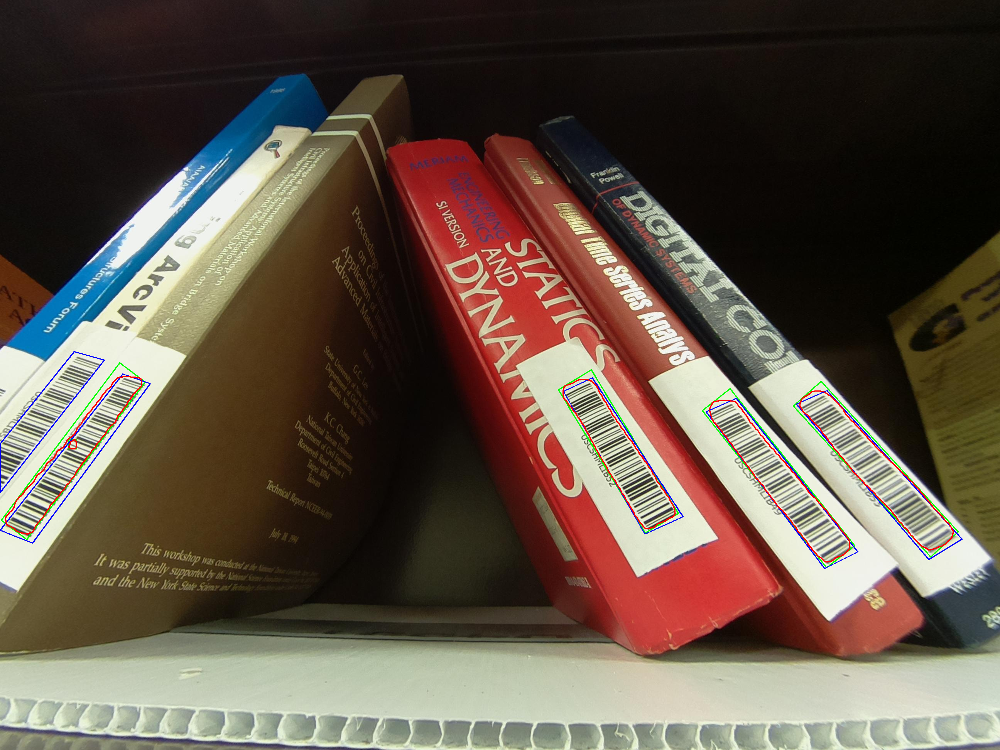

 42%|████▏     | 18/43 [01:00<00:55,  2.23s/it]

number of R mishit is 0
number of G mishit is 0
number of R mishit is 1


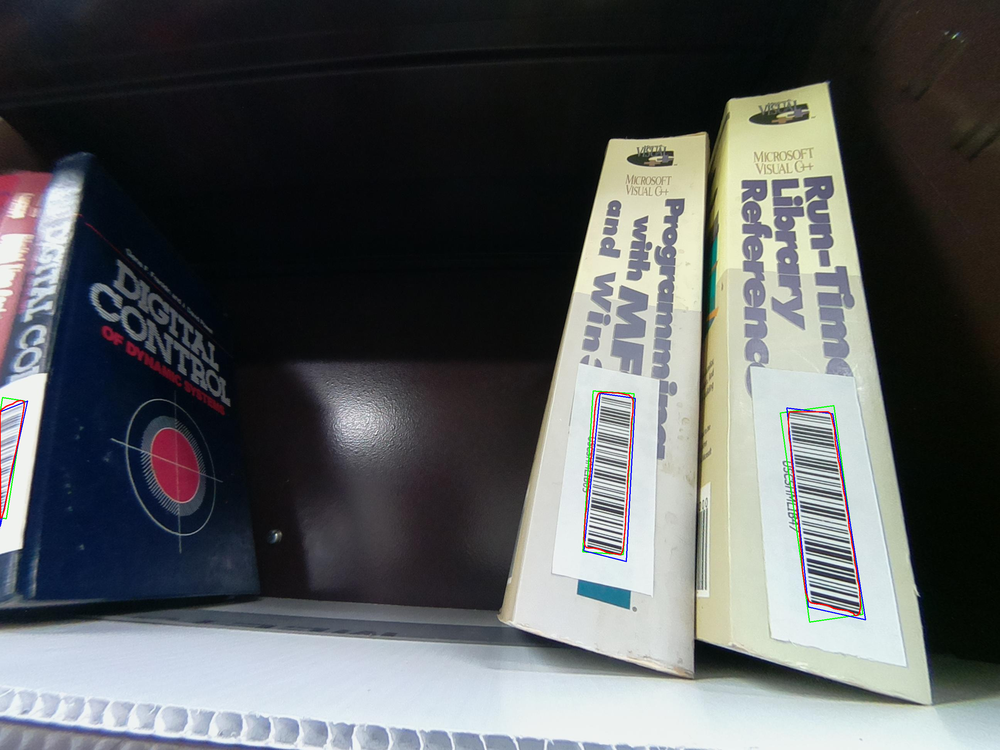

 44%|████▍     | 19/43 [01:02<00:52,  2.18s/it]

number of R mishit is 0
number of G mishit is 0
number of R mishit is 1


100%|██████████| 43/43 [01:58<00:00,  2.75s/it]


In [245]:
df = pd.read_excel('/content/drive/MyDrive/barcode/testData.xlsx') # read the annotation file 
df['Color'] = df['Color'].str.strip()
image_name = df.loc[:, 'Image Filename'].unique() # get unique item in one column 
model.cfg = cfg

misimage = []

sum_hitR = 0
sum_hitG = 0
sum_hitB = 0

sum_R = 0
sum_G = 0
sum_B = 0
for i in tqdm(range(len(image_name))):
  df2 = df[df.loc[:, 'Image Filename']==image_name[i]] # choose data of one image 
  imgAddress = base + image_name[i] + '.jpg'  
  img = mmcv.imread(imgAddress)
  result = inference_detector(model, img)
  predicted_box, predicted_contour = collect_predicted(result)
  dfR = df2[df2.loc[:, 'Color'] == 'R']
  dfG = df2[df2.loc[:, 'Color'] == 'G']
  dfB = df2[df2.loc[:, 'Color'] == 'B']
  true_box = collect_annotation(df2)
  true_boxR = collect_annotation(dfR)
  true_boxG = collect_annotation(dfG)
  true_boxB = collect_annotation(dfB)
  #hit, IoU = truePositive(predicted_box, true_box)
  hitR, IoR = truePositive(predicted_box, true_boxR)
  hitG, IoG = truePositive(predicted_box, true_boxG)
  hitB, IoB = truePositive(predicted_box, true_boxB)

  sum_hitR += hitR
  sum_hitG += hitG
  sum_hitB += hitB

  sum_R += len(true_boxR) 
  sum_G += len(true_boxG) 
  sum_B += len(true_boxB) 

  sum_hit = hitR + hitB + hitG
  sum_all = len(true_boxR)  + len(true_boxG) + len(true_boxB) 
  if sum_hit!=sum_all:
    img = cv2.imread(imgAddress)
    cv2.drawContours(img, predicted_box, -1 ,(0,255,0),2) # predicted result is green
    cv2.drawContours(img, true_box, -1, (255,0,0), 2) # annotated result is blue 
    cv2.drawContours(img, predicted_contour, -1,(0,0,255),2) # the predicted contour is red
    cv2_imshow(img)
    print(f'number of R mishit is {len(true_boxR) - hitR}')
    print(f'number of G mishit is {len(true_boxG) - hitG}')
    print(f'number of B mishit is {len(true_boxB) - hitB}')

In [247]:
# The accuracy of the algorithm is
(sum_hitR + sum_hitG + sum_hitB)/(sum_R + sum_G + sum_B)

0.9791666666666666